## House Price Prediction - Tokyo

### Create SQLite database from CSVs

In [1]:
# Create SQLite database from CSVs
import pandas as pd
import sqlite3
from pathlib import Path

train_csv = r'E:\Cliente\Desktop\Career\Paipe_Case\train_houses.csv'
test_csv = r'E:\Cliente\Desktop\Career\Paipe_Case\test_houses.csv'
db_path = Path(r'E:\Cliente\Desktop\Career\Paipe_Case\houses.db')

# Read CSVs
df_train = pd.read_csv(train_csv)
df_test = pd.read_csv(test_csv)

# Check and create directory if not exists
db_path.parent.mkdir(parents=True, exist_ok=True)

# Connect and save tables to SQLite
conn = sqlite3.connect(db_path)
df_train.to_sql('train_houses', conn, if_exists='replace', index=False)
df_test.to_sql('test_houses', conn, if_exists='replace', index=False)

# Check tables and first rows
print(pd.read_sql("SELECT name FROM sqlite_master WHERE type='table'", conn))
print(pd.read_sql('SELECT * FROM train_houses LIMIT 5', conn))
print(pd.read_sql('SELECT * FROM test_houses LIMIT 5', conn))

# Close connection
conn.close()

# Create df_train_original and df_test_original inside house.db to keep unmodified data
# Read CSVs
df_train_original = pd.read_csv(train_csv)
df_test_original = pd.read_csv(test_csv)
conn = sqlite3.connect(db_path)
df_train_original.to_sql('train_houses_original', conn, if_exists='replace', index=False)
df_test_original.to_sql('test_houses_original', conn, if_exists='replace', index=False)
conn.close()

                    name
0                  train
1                   test
2  train_houses_original
3   test_houses_original
4           train_houses
5            test_houses
                                  Type            Region  MunicipalityCode  \
0         Pre-owned Condominiums, etc.              None             13103   
1  Residential Land(Land and Building)  Residential Area             13120   
2          Residential Land(Land Only)  Residential Area             13201   
3         Pre-owned Condominiums, etc.              None             13208   
4          Residential Land(Land Only)  Residential Area             13117   

  Prefecture   Municipality      DistrictName NearestStation  \
0      Tokyo    Minato Ward            Kaigan      Takeshiba   
1      Tokyo    Nerima Ward           Nishiki   Kamiitabashi   
2      Tokyo  Hachioji City  Shimoongatamachi  Takao (Tokyo)   
3      Tokyo     Chofu City      Kamiishiwara     Nishichofu   
4      Tokyo      Kita Ward         

In [2]:
print(df_train)

                                       Type            Region  \
0              Pre-owned Condominiums, etc.               NaN   
1       Residential Land(Land and Building)  Residential Area   
2               Residential Land(Land Only)  Residential Area   
3              Pre-owned Condominiums, etc.               NaN   
4               Residential Land(Land Only)  Residential Area   
...                                     ...               ...   
325255         Pre-owned Condominiums, etc.               NaN   
325256         Pre-owned Condominiums, etc.               NaN   
325257         Pre-owned Condominiums, etc.               NaN   
325258         Pre-owned Condominiums, etc.               NaN   
325259         Pre-owned Condominiums, etc.               NaN   

        MunicipalityCode Prefecture   Municipality      DistrictName  \
0                  13103      Tokyo    Minato Ward            Kaigan   
1                  13120      Tokyo    Nerima Ward           Nishiki   
2  

In [3]:
print(df_test)

                                      Type            Region  \
0             Pre-owned Condominiums, etc.               NaN   
1             Pre-owned Condominiums, etc.               NaN   
2             Pre-owned Condominiums, etc.               NaN   
3             Pre-owned Condominiums, etc.               NaN   
4      Residential Land(Land and Building)  Residential Area   
...                                    ...               ...   
81309  Residential Land(Land and Building)   Commercial Area   
81310         Pre-owned Condominiums, etc.               NaN   
81311  Residential Land(Land and Building)  Residential Area   
81312         Pre-owned Condominiums, etc.               NaN   
81313  Residential Land(Land and Building)   Commercial Area   

       MunicipalityCode Prefecture   Municipality    DistrictName  \
0                 13103      Tokyo    Minato Ward       Toranomon   
1                 13110      Tokyo    Meguro Ward     Higashiyama   
2                 13112 

In [4]:
print(df_train_original)

                                       Type            Region  \
0              Pre-owned Condominiums, etc.               NaN   
1       Residential Land(Land and Building)  Residential Area   
2               Residential Land(Land Only)  Residential Area   
3              Pre-owned Condominiums, etc.               NaN   
4               Residential Land(Land Only)  Residential Area   
...                                     ...               ...   
325255         Pre-owned Condominiums, etc.               NaN   
325256         Pre-owned Condominiums, etc.               NaN   
325257         Pre-owned Condominiums, etc.               NaN   
325258         Pre-owned Condominiums, etc.               NaN   
325259         Pre-owned Condominiums, etc.               NaN   

        MunicipalityCode Prefecture   Municipality      DistrictName  \
0                  13103      Tokyo    Minato Ward            Kaigan   
1                  13120      Tokyo    Nerima Ward           Nishiki   
2  

In [5]:
print(df_test_original)

                                      Type            Region  \
0             Pre-owned Condominiums, etc.               NaN   
1             Pre-owned Condominiums, etc.               NaN   
2             Pre-owned Condominiums, etc.               NaN   
3             Pre-owned Condominiums, etc.               NaN   
4      Residential Land(Land and Building)  Residential Area   
...                                    ...               ...   
81309  Residential Land(Land and Building)   Commercial Area   
81310         Pre-owned Condominiums, etc.               NaN   
81311  Residential Land(Land and Building)  Residential Area   
81312         Pre-owned Condominiums, etc.               NaN   
81313  Residential Land(Land and Building)   Commercial Area   

       MunicipalityCode Prefecture   Municipality    DistrictName  \
0                 13103      Tokyo    Minato Ward       Toranomon   
1                 13110      Tokyo    Meguro Ward     Higashiyama   
2                 13112 

#### Drop attributes due to redundancy, many missing values, derivation, low added value.

Type, Region, MunicipalityCode, Prefecture, TimeToNearestStation, MaxTimeToNearestStation, FloorPlan, UnitPrice, PricePerTsubo, LandShape, Frontage, TotalFloorArea, PrewarBuilding, Purpose, Direction, Classification, Breadth, CityPlanning, Period, Remarks.

In [6]:
# Drop requested attributes from train and test and update the DB
cols_to_drop = [
    'Type', 'Region', 'MunicipalityCode', 'Prefecture', 'NearestStation',
    'TimeToNearestStation', 'MaxTimeToNearestStation', 'FloorPlan',
    'UnitPrice', 'PricePerTsubo', 'LandShape', 'Frontage',
    'TotalFloorArea', 'PrewarBuilding', 'Purpose', 'Direction',
    'Classification', 'Breadth', 'CityPlanning', 'Period', 'Remarks'
]

# Remove columns (ignore if not exist)
df_train.drop(columns=cols_to_drop, errors='ignore', inplace=True)
df_test.drop(columns=cols_to_drop, errors='ignore', inplace=True)

# Update tables in SQLite (overwrites existing)
conn = sqlite3.connect(db_path)
df_train.to_sql('train_houses', conn, if_exists='replace', index=False)
df_test.to_sql('test_houses', conn, if_exists='replace', index=False)
conn.close()

Remove rows of flags considered outliers

In [7]:
# Remove rows where AreaIsGreaterFlag==1 OR FrontageIsGreaterFlag==True OR TotalFloorAreaIsGreaterFlag==1
import numpy as np

flags = [
    ('AreaIsGreaterFlag', 1),
    ('FrontageIsGreaterFlag', True),
    ('TotalFloorAreaIsGreaterFlag', 1),
]

def drop_flagged_rows(df):
    if df is None or df.empty:
        return df
    mask = np.zeros(len(df), dtype=bool)
    for col, val in flags:
        if col in df.columns:
            # safe comparisons (treat NaNs automatically)
            mask = mask | (df[col] == val)
    return df.loc[~mask].copy()

# Apply removal
df_train = drop_flagged_rows(df_train)
df_test = drop_flagged_rows(df_test)

print(df_train.head())
print(df_test.head())

# Update tables in SQLite
import sqlite3
conn = sqlite3.connect(db_path)
df_train.to_sql('train_houses', conn, if_exists='replace', index=False)
df_test.to_sql('test_houses', conn, if_exists='replace', index=False)
conn.close()

    Municipality      DistrictName  MinTimeToNearestStation  Area  \
0    Minato Ward            Kaigan                      1.0    35   
1    Nerima Ward           Nishiki                     15.0   110   
2  Hachioji City  Shimoongatamachi                     60.0   135   
3     Chofu City      Kamiishiwara                     16.0    60   
4      Kita Ward             Shimo                      6.0    60   

   AreaIsGreaterFlag  FrontageIsGreaterFlag  TotalFloorAreaIsGreaterFlag  \
0                  0                  False                            0   
1                  0                  False                            0   
2                  0                  False                            0   
3                  0                  False                            0   
4                  0                  False                            0   

   BuildingYear Structure    Use  CoverageRatio  FloorAreaRatio  Year  \
0        1979.0       SRC  House           60.0        

In [8]:
# Drop out AreaIsGreaterFlag, FrontageIsGreaterFlag and TotalFloorAreaIsGreaterFlag
cols_to_remove = ['AreaIsGreaterFlag', 'FrontageIsGreaterFlag', 'TotalFloorAreaIsGreaterFlag']

# Remove
df_train.drop(columns=cols_to_remove, errors='ignore', inplace=True)
df_test.drop(columns=cols_to_remove, errors='ignore', inplace=True)

print(df_train.head())
print(df_test.head())

# Update tables in SQLite
import sqlite3
conn = sqlite3.connect(db_path)
df_train.to_sql('train_houses', conn, if_exists='replace', index=False)
df_test.to_sql('test_houses', conn, if_exists='replace', index=False)
conn.close()

    Municipality      DistrictName  MinTimeToNearestStation  Area  \
0    Minato Ward            Kaigan                      1.0    35   
1    Nerima Ward           Nishiki                     15.0   110   
2  Hachioji City  Shimoongatamachi                     60.0   135   
3     Chofu City      Kamiishiwara                     16.0    60   
4      Kita Ward             Shimo                      6.0    60   

   BuildingYear Structure    Use  CoverageRatio  FloorAreaRatio  Year  \
0        1979.0       SRC  House           60.0           400.0  2011   
1        2013.0         W  House           60.0           200.0  2013   
2           NaN       NaN    NaN           40.0            80.0  2007   
3        1999.0        RC  House           60.0           200.0  2015   
4           NaN       NaN    NaN           60.0           200.0  2015   

   Quarter Renovation  TradePrice  
0        1       Done    24000000  
1        3        NaN    51000000  
2        4        NaN    14000000  
3 

#### Mean TradePrice by Municipality

In [9]:
# Load required libraries and data from the SQLite DB
import pandas as pd
import sqlite3
from pathlib import Path
import plotly.express as px

db_path = Path(r'E:\Cliente\Desktop\Career\Paipe_Case\houses.db')
conn = sqlite3.connect(db_path)
df = pd.read_sql('SELECT * FROM train_houses', conn)
conn.close()

# Detect municipality column (prefer columns starting with 'municip')
municipality_candidates = [c for c in df.columns if c.lower().startswith('municip')]
if municipality_candidates:
    muni_col = municipality_candidates[0]
else:
    # fallback to common alternatives
    alt = [c for c in df.columns if any(k in c.lower() for k in ('city','town','municipality'))]
    if alt:
        muni_col = alt[0]
    else:
        raise ValueError('Municipality column not found.')

# Detect price column (search for 'trade' or 'price')
price_candidates = [c for c in df.columns if 'trade' in c.lower() or 'price' in c.lower()]
if not price_candidates:
    raise ValueError('Price column not found.')
price_col = price_candidates[0]

# Compute mean price per municipality (keep all municipalities)
group = df.groupby(muni_col, dropna=False)[price_col].mean().reset_index()
group = group.dropna(subset=[muni_col])
group = group.sort_values(price_col, ascending=False)

# Use all municipalities for the plot
plot_df = group
print(f'Total municipalities: {len(group)}; plotting all of them')
display(plot_df)

# Create a horizontal bar chart in a smoother blue for all municipalities
fig = px.bar(plot_df, x=price_col, y=muni_col, orientation='h',
             title=f'Mean {price_col} by {muni_col} (all municipalities)',
             labels={price_col: f'Mean {price_col}', muni_col: 'Municipality'},
             color_discrete_sequence=['#4A90E2'])

# Order categories by value and set a dynamic height to accommodate many municipalities
fig.update_layout(yaxis={'categoryorder':'total ascending'},
                  height=max(600, min(2500, 20 * len(plot_df))))
fig.show()

Total municipalities: 59; plotting all of them


,Municipality,TradePrice
5,Chiyoda Ward,1.446129e+08
34,Minato Ward,1.238733e+08
50,Shibuya Ward,1.169054e+08
7,Chuo Ward,8.936435e+07
33,Meguro Ward,8.230306e+07
39,Musashino City,8.016558e+07
49,Setagaya Ward,7.199804e+07
52,Shinjuku Ward,6.791754e+07
4,Bunkyo Ward,6.425614e+07
56,Taito Ward,6.243242e+07


### Mean TradePrice by District (selected ranks)

Show district #1 (most expensive), #100, #200, ..., #1400, and #1439 (if they exist).

In [10]:
# Load libraries and data
import pandas as pd
import sqlite3
from pathlib import Path
import plotly.express as px

db_path = Path(r'E:\Cliente\Desktop\Career\Paipe_Case\houses.db')
conn = sqlite3.connect(db_path)
df = pd.read_sql('SELECT * FROM train_houses', conn)
conn.close()

# Detect district column 
district_candidates = [c for c in df.columns if 'distr' in c.lower()]
if district_candidates:
    district_col = district_candidates[0]
else:
    alt = [c for c in df.columns if any(k in c.lower() for k in ('district','districtname','ward'))]
    if alt:
        district_col = alt[0]
    else:
        raise ValueError('District column not found.')

# Detect price column 
price_candidates = [c for c in df.columns if 'trade' in c.lower() or 'price' in c.lower()]
if not price_candidates:
    raise ValueError('Price column not found.')
price_col = price_candidates[0]

# Compute mean price per district and sort descending
group = df.groupby(district_col, dropna=False)[price_col].mean().reset_index()
group = group.dropna(subset=[district_col]).reset_index(drop=True)
group = group.sort_values(price_col, ascending=False).reset_index(drop=True)

# Prepare requested ranks: 1,100,200,...,1400,1439 (clipped to available districts)
requested = [1] + list(range(100, 1401, 100)) + [1439]
n = len(group)
valid_ranks = [r for r in requested if r <= n]

# Collect rows at those ranks (1-based rank -> iloc index r-1)
rows = []
for r in valid_ranks:
    row = group.iloc[r-1].copy()
    row['Rank'] = r
    rows.append(row)

selected_df = pd.DataFrame(rows).sort_values('Rank').reset_index(drop=True)
print(f'Total districts: {n}; selected ranks: {valid_ranks}')
display(selected_df)

# Plot selected districts in the same smoother blue (#4A90E2)
fig = px.bar(selected_df,
             x=price_col,
             y=district_col,
             orientation='h',
             title=f'Mean {price_col} by {district_col} — selected ranks',
             labels={price_col: f'Mean {price_col}', district_col: 'District'},
             color_discrete_sequence=['#4A90E2'])

fig.update_layout(yaxis={'categoryorder':'total ascending'}, height=600)
fig.show()

Total districts: 1439; selected ranks: [1, 100, 200, 300, 400, 500, 600, 700, 800, 900, 1000, 1100, 1200, 1300, 1400, 1439]


,DistrictName,TradePrice,Rank
0,Kioicho,1.995000e+09,1
1,Kichijojihoncho,1.258932e+08,100
2,Misakicho,7.986957e+07,200
3,Naritanishi,6.542879e+07,300
4,Shibaura,5.889781e+07,400
5,Numabukuro,5.437459e+07,500
6,Nishifucho,4.999296e+07,600
7,Shimo,4.621318e+07,700
8,Oizumigakuencho,4.236190e+07,800
9,Azusawa,3.916561e+07,900


In [11]:
# Compute and plot the top 30 most expensive districts by mean TradePrice
import pandas as pd
import sqlite3
from pathlib import Path
import plotly.express as px

db_path = Path(r'E:\Cliente\Desktop\Career\Paipe_Case\houses.db')
conn = sqlite3.connect(db_path)
df = pd.read_sql('SELECT * FROM train_houses', conn)
conn.close()

# Detect district column (look for 'distr' then fallbacks)
district_candidates = [c for c in df.columns if 'distr' in c.lower()]
if district_candidates:
    district_col = district_candidates[0]
else:
    alt = [c for c in df.columns if any(k in c.lower() for k in ('district','districtname','ward'))]
    if alt:
        district_col = alt[0]
    else:
        raise ValueError('District column not found.')

# Detect price column (search for 'trade' or 'price')
price_candidates = [c for c in df.columns if 'trade' in c.lower() or 'price' in c.lower()]
if not price_candidates:
    raise ValueError('Price column not found.')
price_col = price_candidates[0]

# Compute mean price per district and get top 30
group = df.groupby(district_col, dropna=False)[price_col].mean().reset_index()
group = group.dropna(subset=[district_col])
group = group.sort_values(price_col, ascending=False)
top_n = 30
top30 = group.head(top_n).reset_index(drop=True)

print(f'Top {top_n} districts by mean {price_col}:')
display(top30)

# Plot horizontal bar chart in a smoother blue (#4A90E2)
fig = px.bar(top30,
             x=price_col,
             y=district_col,
             orientation='h',
             title=f'Top {top_n} Districts by Mean {price_col}',
             labels={price_col: f'Mean {price_col}', district_col: 'District'},
             color_discrete_sequence=['#4A90E2'])
fig.update_layout(yaxis={'categoryorder':'total ascending'}, height=max(600, 30 * 30))
fig.show()

Top 30 districts by mean TradePrice:


,DistrictName,TradePrice
0,Kioicho,1.995000e+09
1,Kandamatsunagacho,1.600000e+09
2,Yaesu,1.281818e+09
3,Kandaiwamotocho,1.090000e+09
4,Yuurakucho,1.087500e+09
5,Azabunagasakacho,7.980000e+08
6,Kasumigaseki,7.500000e+08
7,Nagatacho,7.432432e+08
8,Kitaaoyama,6.278510e+08
9,Nihombashi,5.865192e+08


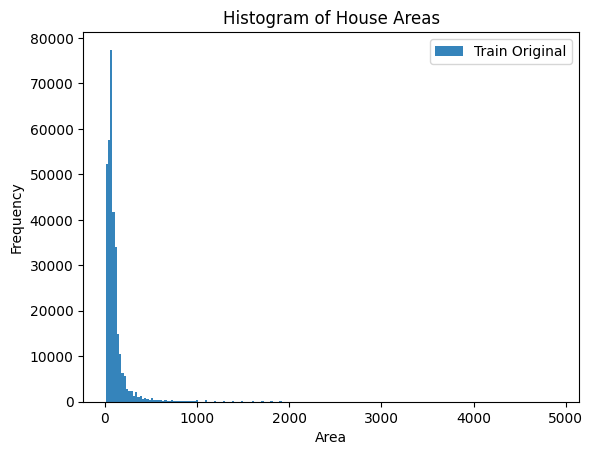

In [12]:
# Create an histogram of Area 
import matplotlib.pyplot as plt

plt.hist(df_train['Area'], bins=200, alpha=0.9, label='Train Original')
plt.xlabel('Area')
plt.ylabel('Frequency')
plt.title('Histogram of House Areas')
plt.legend()
plt.show()


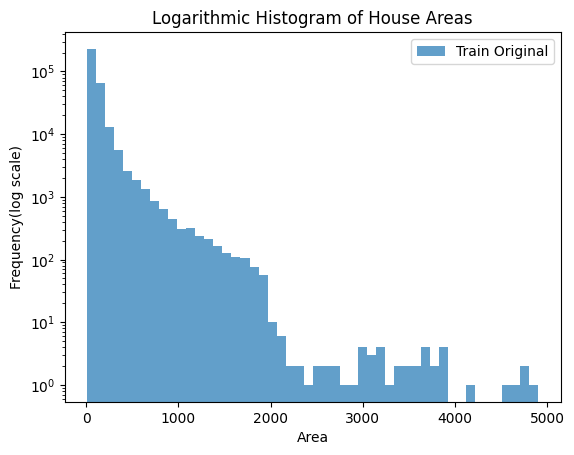

In [13]:
#Create a histogram of Area with log scale for frequency
import matplotlib.pyplot as plt

plt.hist(df_train['Area'], bins=50, alpha=0.7, label='Train Original')
plt.yscale('log')
plt.xlabel('Area')
plt.ylabel('Frequency(log scale)')
plt.title('Logarithmic Histogram of House Areas')
plt.legend()
plt.show()

In [14]:
# Create 'TradePrice/m²' in df_train as TradePrice divided by Area (train_houses only)
import numpy as np

if 'TradePrice' not in df_train.columns or 'Area' not in df_train.columns:
    raise KeyError("Required columns 'TradePrice' or 'Area' not found in df_train")

# Avoid division by zero: replace 0 with NaN, then compute
area_safe = df_train['Area'].replace({0: np.nan})
df_train['TradePrice/m²'] = df_train['TradePrice'] / area_safe

print("Preview of 'TradePrice', 'Area', and new 'TradePrice/m²':")
display(df_train[['TradePrice', 'Area', 'TradePrice/m²']].head())

# Update only train_houses table in the SQLite DB (overwrite)
import sqlite3
conn = sqlite3.connect(db_path)
df_train.to_sql('train_houses', conn, if_exists='replace', index=False)
conn.close()
print('\nUpdated train_houses table in DB:', db_path)

Preview of 'TradePrice', 'Area', and new 'TradePrice/m²':


,TradePrice,Area,TradePrice/m²
0,24000000,35,685714.285714
1,51000000,110,463636.363636
2,14000000,135,103703.703704
3,23000000,60,383333.333333
4,33000000,60,550000.000000



Updated train_houses table in DB: E:\Cliente\Desktop\Career\Paipe_Case\houses.db


### Histogram: TradePrice/m² (detect outliers)

This cell shows summary stats and a histogram for the 'TradePrice/m²' attribute in train_houses. A line at the 99th percentile is drawn to highlight extreme values.

In [15]:
# Histogram and summary for 'TradePrice/m²' in df_train
import plotly.express as px
import numpy as np

col = 'TradePrice/m²'
if col not in df_train.columns:
    raise KeyError(f"Column '{col}' not found in df_train. Make sure it was created earlier.")

s = df_train[col].dropna()
if s.empty:
    print(f"Column '{col}' contains no non-null values in df_train.")
else:
    # Basic stats
    print('Summary statistics:')
    display(s.describe())
    q = s.quantile([0.01, 0.05, 0.25, 0.5, 0.75, 0.95, 0.99])
    print('\nSelected quantiles:')
    display(q)

    p99 = float(q.loc[0.99])
    p95 = float(q.loc[0.95])

    # Dark blue color for plots
    dark_blue = '#0B3D91'

    # 1) Log-transformed histogram (works only for positive values) to spread values
    s_pos = s[s > 0]
    if not s_pos.empty:
        s_log = np.log1p(s_pos)
        fig2 = px.histogram(
            s_log, nbins=100,
            title="Histogram of log1p(TradePrice/m²)",
            labels={'value':'log1p(TradePrice/m²)'},
            color_discrete_sequence=[dark_blue],
        )
        fig2.update_layout(bargap=0.05, height=450)
        fig2.show()
    else:
        print('No positive values for log transform.')

Summary statistics:


count    3.229190e+05
mean     6.020817e+05
std      5.828028e+05
min      5.000000e-01
25%      3.190983e+05
50%      5.000000e+05
75%      7.647059e+05
max      5.052632e+07
Name: TradePrice/m², dtype: float64


Selected quantiles:


0.01    4.838710e+04
0.05    1.371429e+05
0.25    3.190983e+05
0.50    5.000000e+05
0.75    7.647059e+05
0.95    1.200000e+06
0.99    2.250000e+06
Name: TradePrice/m², dtype: float64

In [16]:
# Drop rows in df_train with 'TradePrice/m²' below 1st pct or above 99th pct and update DB
col = 'TradePrice/m²'
if col not in df_train.columns:
    raise KeyError(f"Column '{col}' not found in df_train. Create it before running this cell.")

s = df_train[col].dropna()
if s.empty:
    print(f"No non-null values in '{col}'; nothing to drop.")
else:
    q01 = float(s.quantile(0.01))
    q99 = float(s.quantile(0.99))
    before = len(df_train)
    mask_keep = (df_train[col] >= q01) & (df_train[col] <= q99)
    df_train = df_train.loc[mask_keep].reset_index(drop=True)
    after = len(df_train)
    print(f"Dropped rows outside [{q01:.4f}, {q99:.4f}]. Before: {before}, After: {after}, Removed: {before - after}")

    # Update train_houses table in DB
    import sqlite3
    conn = sqlite3.connect(db_path)
    df_train.to_sql('train_houses', conn, if_exists='replace', index=False)
    conn.close()
    print('\nUpdated train_houses table in DB:', db_path)

Dropped rows outside [48387.0968, 2250000.0000]. Before: 322919, After: 316482, Removed: 6437

Updated train_houses table in DB: E:\Cliente\Desktop\Career\Paipe_Case\houses.db


In [17]:
# Histogram and summary for 'TradePrice/m²' in df_train
import plotly.express as px
import numpy as np

col = 'TradePrice/m²'
if col not in df_train.columns:
    raise KeyError(f"Column '{col}' not found in df_train. Make sure it was created earlier.")

s = df_train[col].dropna()
if s.empty:
    print(f"Column '{col}' contains no non-null values in df_train.")
else:
    # Basic stats
    print('Summary statistics:')
    display(s.describe())
    q = s.quantile([0.01, 0.05, 0.25, 0.5, 0.75, 0.95, 0.99])
    print('\nSelected quantiles:')
    display(q)

    p99 = float(q.loc[0.99])
    p95 = float(q.loc[0.95])

    # Dark blue color for plots
    dark_blue = '#0B3D91'

    # 1) Log-transformed histogram (works only for positive values) to spread values
    s_pos = s[s > 0]
    if not s_pos.empty:
        s_log = np.log1p(s_pos)
        fig2 = px.histogram(
            s_log, nbins=100,
            title="Histogram of log1p(TradePrice/m²)",
            labels={'value':'log1p(TradePrice/m²)'},
            color_discrete_sequence=[dark_blue],
        )
        fig2.update_layout(bargap=0.05, height=450)
        fig2.show()
    else:
        print('No positive values for log transform.')

Summary statistics:


count    3.164820e+05
mean     5.699442e+05
std      3.312799e+05
min      4.838710e+04
25%      3.225806e+05
50%      5.000000e+05
75%      7.578947e+05
max      2.250000e+06
Name: TradePrice/m², dtype: float64


Selected quantiles:


0.01    8.115942e+04
0.05    1.500000e+05
0.25    3.225806e+05
0.50    5.000000e+05
0.75    7.578947e+05
0.95    1.166667e+06
0.99    1.600000e+06
Name: TradePrice/m², dtype: float64

In [18]:
# Histogram and summary for 'TradePrice' in df_train
import plotly.express as px
import numpy as np

col = 'TradePrice'
if col not in df_train.columns:
    raise KeyError(f"Column '{col}' not found in df_train. Make sure it was created earlier.")

s = df_train[col].dropna()
if s.empty:
    print(f"Column '{col}' contains no non-null values in df_train.")
else:
    # Basic stats
    print('Summary statistics:')
    display(s.describe())
    q = s.quantile([0.01, 0.05, 0.25, 0.5, 0.75, 0.95, 0.99])
    print('\nSelected quantiles:')
    display(q)

    p99 = float(q.loc[0.99])
    p95 = float(q.loc[0.95])

    # Dark blue color for plots
    dark_blue = '#0B3D91'

    # 1) Log-transformed histogram (works only for positive values) to spread values
    s_pos = s[s > 0]
    if not s_pos.empty:
        s_log = np.log1p(s_pos)
        fig2 = px.histogram(
            s_log, nbins=100,
            title="Histogram of log1p(TradePrice)",
            labels={'value':'log1p(TradePrice)'},
            color_discrete_sequence=[dark_blue],
        )
        fig2.update_layout(bargap=0.05, height=450)
        fig2.show()
    else:
        print('No positive values for log transform.')

Summary statistics:


count    3.164820e+05
mean     4.969360e+07
std      7.276773e+07
min      5.000000e+05
25%      2.200000e+07
50%      3.500000e+07
75%      5.300000e+07
max      3.300000e+09
Name: TradePrice, dtype: float64


Selected quantiles:


0.01      4700000.0
0.05      9000000.0
0.25     22000000.0
0.50     35000000.0
0.75     53000000.0
0.95    130000000.0
0.99    340000000.0
Name: TradePrice, dtype: float64

In [19]:
# Drop rows in df_train with 'TradePrice' below 1st pct or above 99th pct and update DB
col = 'TradePrice'
if col not in df_train.columns:
    raise KeyError(f"Column '{col}' not found in df_train. Create it before running this cell.")

s = df_train[col].dropna()
if s.empty:
    print(f"No non-null values in '{col}'; nothing to drop.")
else:
    q01 = float(s.quantile(0.01))
    q99 = float(s.quantile(0.99))
    before = len(df_train)
    mask_keep = (df_train[col] >= q01) & (df_train[col] <= q99)
    df_train = df_train.loc[mask_keep].reset_index(drop=True)
    after = len(df_train)
    print(f"Dropped rows outside [{q01:.4f}, {q99:.4f}]. Before: {before}, After: {after}, Removed: {before - after}")

    # Update train_houses table in DB
    import sqlite3
    conn = sqlite3.connect(db_path)
    df_train.to_sql('train_houses', conn, if_exists='replace', index=False)
    conn.close()
    print('\nUpdated train_houses table in DB:', db_path)

Dropped rows outside [4700000.0000, 340000000.0000]. Before: 316482, After: 310293, Removed: 6189

Updated train_houses table in DB: E:\Cliente\Desktop\Career\Paipe_Case\houses.db


In [20]:
# Histogram and summary for 'TradePrice' in df_train
import plotly.express as px
import numpy as np

col = 'TradePrice'
if col not in df_train.columns:
    raise KeyError(f"Column '{col}' not found in df_train. Make sure it was created earlier.")

s = df_train[col].dropna()
if s.empty:
    print(f"Column '{col}' contains no non-null values in df_train.")
else:
    # Basic stats
    print('Summary statistics:')
    display(s.describe())
    q = s.quantile([0.01, 0.05, 0.25, 0.5, 0.75, 0.95, 0.99])
    print('\nSelected quantiles:')
    display(q)

    p99 = float(q.loc[0.99])
    p95 = float(q.loc[0.95])

    # Dark blue color for plots
    dark_blue = '#0B3D91'

    # 1) Log-transformed histogram (works only for positive values) to spread values
    s_pos = s[s > 0]
    if not s_pos.empty:
        s_log = np.log1p(s_pos)
        fig2 = px.histogram(
            s_log, nbins=100,
            title="Histogram of log1p(TradePrice)",
            labels={'value':'log1p(TradePrice)'},
            color_discrete_sequence=[dark_blue],
        )
        fig2.update_layout(bargap=0.05, height=450)
        fig2.show()
    else:
        print('No positive values for log transform.')

Summary statistics:


count    3.102930e+05
mean     4.497426e+07
std      4.121754e+07
min      4.700000e+06
25%      2.200000e+07
50%      3.500000e+07
75%      5.200000e+07
max      3.400000e+08
Name: TradePrice, dtype: float64


Selected quantiles:


0.01      6000000.0
0.05      9700000.0
0.25     22000000.0
0.50     35000000.0
0.75     52000000.0
0.95    120000000.0
0.99    240000000.0
Name: TradePrice, dtype: float64

In [21]:
# Mean TradePrice by Municipality for all municipalities
# Load required libraries and data from the SQLite DB
import pandas as pd
import sqlite3
from pathlib import Path
import plotly.express as px

db_path = Path(r'E:\Cliente\Desktop\Career\Paipe_Case\houses.db')
conn = sqlite3.connect(db_path)
df = pd.read_sql('SELECT * FROM train_houses', conn)
conn.close()

# Detect municipality column
municipality_candidates = [c for c in df.columns if c.lower().startswith('municip')]
if municipality_candidates:
    muni_col = municipality_candidates[0]
else:
    # fallback to common alternatives
    alt = [c for c in df.columns if any(k in c.lower() for k in ('city','town','municipality'))]
    if alt:
        muni_col = alt[0]
    else:
        raise ValueError('Municipality column not found.')

# Detect price column
price_candidates = [c for c in df.columns if 'trade' in c.lower() or 'price' in c.lower()]
if not price_candidates:
    raise ValueError('Price column not found.')
price_col = price_candidates[0]

# Compute mean price per municipality (keep all municipalities)
group = df.groupby(muni_col, dropna=False)[price_col].mean().reset_index()
group = group.dropna(subset=[muni_col])
group = group.sort_values(price_col, ascending=False)

# Use all municipalities for the plot
plot_df = group
print(f'Total municipalities: {len(group)}; plotting all of them')
display(plot_df)

# Create a horizontal bar chart in a smoother blue for all municipalities
fig = px.bar(plot_df, x=price_col, y=muni_col, orientation='h',
             title=f'Mean {price_col} by {muni_col} (all municipalities)',
             labels={price_col: f'Mean {price_col}', muni_col: 'Municipality'},
             color_discrete_sequence=['#4A90E2'],
        )

# Order categories by value and set a dynamic height to accommodate many municipalities
fig.update_layout(yaxis={'categoryorder':'total ascending'},
                  height=max(600, min(2500, 20 * len(plot_df))))
fig.show()

Total municipalities: 58; plotting all of them


,Municipality,TradePrice
38,Musashino City,6.589744e+07
33,Meguro Ward,6.399986e+07
48,Setagaya Ward,6.372462e+07
34,Minato Ward,6.038474e+07
49,Shibuya Ward,5.813194e+07
52,Suginami Ward,5.467020e+07
35,Mitaka City,5.451358e+07
5,Chiyoda Ward,5.409941e+07
31,Kunitachi City,5.188837e+07
39,Nakano Ward,5.057048e+07


In [22]:
# Load libraries and data
import pandas as pd
import sqlite3
from pathlib import Path
import plotly.express as px

db_path = Path(r'E:\Cliente\Desktop\Career\Paipe_Case\houses.db')
conn = sqlite3.connect(db_path)
df = pd.read_sql('SELECT * FROM train_houses', conn)
conn.close()

# Detect district column (look for 'distr' or fallbacks)
district_candidates = [c for c in df.columns if 'distr' in c.lower()]
if district_candidates:
    district_col = district_candidates[0]
else:
    alt = [c for c in df.columns if any(k in c.lower() for k in ('district','districtname','ward'))]
    if alt:
        district_col = alt[0]
    else:
        raise ValueError('District column not found.')

# Detect price column (search for 'trade' or 'price')
price_candidates = [c for c in df.columns if 'trade' in c.lower() or 'price' in c.lower()]
if not price_candidates:
    raise ValueError('Price column not found.')
price_col = price_candidates[0]

# Compute mean price per district and sort descending
group = df.groupby(district_col, dropna=False)[price_col].mean().reset_index()
group = group.dropna(subset=[district_col]).reset_index(drop=True)
group = group.sort_values(price_col, ascending=False).reset_index(drop=True)

# Prepare requested ranks: 1,100,200,...,1400,1439 (clipped to available districts)
requested = [1] + list(range(100, 1401, 100)) + [1439]
n = len(group)
valid_ranks = [r for r in requested if r <= n]

# Collect rows at those ranks (1-based rank -> iloc index r-1)
rows = []
for r in valid_ranks:
    row = group.iloc[r-1].copy()
    row['Rank'] = r
    rows.append(row)

selected_df = pd.DataFrame(rows).sort_values('Rank').reset_index(drop=True)
print(f'Total districts: {n}; selected ranks: {valid_ranks}')
display(selected_df)

# Plot selected districts in the same smoother blue (#4A90E2)
fig = px.bar(selected_df,
             x=price_col,
             y=district_col,
             orientation='h',
             title=f'Mean {price_col} by {district_col} — selected ranks',
             labels={price_col: f'Mean {price_col}', district_col: 'District'},
             color_discrete_sequence=['#4A90E2'])

fig.update_layout(yaxis={'categoryorder':'total ascending'}, height=600)
fig.show()

Total districts: 1397; selected ranks: [1, 100, 200, 300, 400, 500, 600, 700, 800, 900, 1000, 1100, 1200, 1300]


,DistrictName,TradePrice,Rank
0,Yuurakucho,3.000000e+08,1
1,Nampeidaicho,7.042326e+07,100
2,Higashigotanda,5.873639e+07,200
3,Den-enchofuhoncho,5.291652e+07,300
4,Minamiotsuka,4.934470e+07,400
5,Yazakicho,4.609574e+07,500
6,Nukuiminamicho,4.336107e+07,600
7,Nihombashihamacho,4.118519e+07,700
8,Yazaike,3.866116e+07,800
9,Oshitate,3.694022e+07,900


More Cleaning

In [23]:
#Drop rows with missing DistrictName for train_houses and test_houses
df_train = df_train.dropna(subset=['DistrictName']).reset_index(drop=True)
df_test = df_test.dropna(subset=['DistrictName']).reset_index(drop=True)
#update houses.db
import sqlite3
conn = sqlite3.connect(db_path)
df_train.to_sql('train_houses', conn, if_exists='replace', index=False)
df_test.to_sql('test_houses', conn, if_exists='replace', index=False)
conn.close()


In [ ]:
#Fill missing values in MinTimeToNearestStation using median per DistrictName (fallback to global median)
for df in [df_train, df_test]:
    global_median = df['MinTimeToNearestStation'].median()
    medians = df.groupby('DistrictName')['MinTimeToNearestStation'].median()
    def fill_min_time(row):
        if pd.isna(row['MinTimeToNearestStation']):
            district = row['DistrictName']
            if district in medians and not pd.isna(medians[district]):
                return medians[district]
            else:
                return global_median
        else:
            return row['MinTimeToNearestStation']
    df['MinTimeToNearestStation'] = df.apply(fill_min_time, axis=1)
#update houses.db
import sqlite3
conn = sqlite3.connect('houses.db')
df_train.to_sql('train', conn, if_exists='replace', index=False)
df_test.to_sql('test', conn, if_exists='replace', index=False)
conn.close()

80683

In [ ]:
#Fill missing values in CoverageRatio using median per DistrictName (fallback to global median)
for df in [df_train, df_test]:
    global_median = df['CoverageRatio'].median()
    medians = df.groupby('DistrictName')['CoverageRatio'].median()
    def fill_coverage_ratio(row):
        if pd.isna(row['CoverageRatio']):
            district = row['DistrictName']
            if district in medians and not pd.isna(medians[district]):
                return medians[district]
            else:
                return global_median
        else:
            return row['CoverageRatio']
    df['CoverageRatio'] = df.apply(fill_coverage_ratio, axis=1)
#update houses.db
import sqlite3
conn = sqlite3.connect(db_path)
df_train.to_sql('train_houses', conn, if_exists='replace', index=False)
df_test.to_sql('test_houses', conn, if_exists='replace', index=False)
conn.close()


In [ ]:
#Fill missing values in FloorAreaRatio using median per DistrictName (fallback to global median)
for df in [df_train, df_test]:
    global_median = df['FloorAreaRatio'].median()
    medians = df.groupby('DistrictName')['FloorAreaRatio'].median()
    def fill_floor_area_ratio(row):
        if pd.isna(row['FloorAreaRatio']):
            district = row['DistrictName']
            if district in medians and not pd.isna(medians[district]):
                return medians[district]
            else:
                return global_median
        else:
            return row['FloorAreaRatio']
    df['FloorAreaRatio'] = df.apply(fill_floor_area_ratio, axis=1)
#update houses.db
import sqlite3  
conn = sqlite3.connect(db_path)
df_train.to_sql('train_houses', conn, if_exists='replace', index=False)
df_test.to_sql('test_houses', conn, if_exists='replace', index=False)
conn.close()

In [27]:
#Drop out "Use" column from train_houses and test_houses
df_train = df_train.drop(columns=['Use'], errors='ignore')
df_test = df_test.drop(columns=['Use'], errors='ignore')
#update houses.db
import sqlite3
conn = sqlite3.connect(db_path)
df_train.to_sql('train_houses', conn, if_exists='replace', index=False)
df_test.to_sql('test_houses', conn, if_exists='replace', index=False)
conn.close()

In [ ]:
#Fill missing values in Renovation with Unknown, "Not yet" with "No", "Done" with "Yes". 
for df in [df_train, df_test]:
    df['Renovation'] = df['Renovation'].fillna('Unknown')
    df['Renovation'] = df['Renovation'].replace({'Not yet': 'No', 'Done': 'Yes'})
#update houses.db
import sqlite3
conn = sqlite3.connect(db_path)
df_train.to_sql('train_houses', conn, if_exists='replace', index=False)
df_test.to_sql('test_houses', conn, if_exists='replace', index=False)
conn.close()

In [29]:
#Fill Structure column missing values with Unknown.
for df in [df_train, df_test]:
    df['Structure'] = df['Structure'].fillna('Unknown')
#update houses.db
import sqlite3
conn = sqlite3.connect(db_path)
df_train.to_sql('train_houses', conn, if_exists='replace', index=False)
df_test.to_sql('test_houses', conn, if_exists='replace', index=False)
conn.close()

In [ ]:
#Target Encoding for "Structure" column in train_houses using TradePrice/m² as target, applying it vectorized.
import numpy as np  
if 'TradePrice/m²' not in df_train.columns:
    raise KeyError("Column 'TradePrice/m²' not found in df_train. Make sure it was created earlier.")   
structure_means = df_train.groupby('Structure')['TradePrice/m²'].mean()
structure_mean_dict = structure_means.to_dict()
df_train['Structure_TE'] = df_train['Structure'].map(structure_mean_dict)
#update houses.db
import sqlite3
conn = sqlite3.connect(db_path)
df_train.to_sql('train_houses', conn, if_exists='replace', index=False)
df_test.to_sql('test_houses', conn, if_exists='replace', index=False)
conn.close()

#Apply the same Target Encoding mapping to test_houses
df_test['Structure_TE'] = df_test['Structure'].map(structure_mean_dict)
#update houses.db
import sqlite3
conn = sqlite3.connect(db_path)
df_test.to_sql('test_houses', conn, if_exists='replace', index=False)
conn.close()

#Drop Structure column:
df_train = df_train.drop(columns=['Structure'], errors='ignore')
df_test = df_test.drop(columns=['Structure'], errors='ignore')
#update houses.db
import sqlite3
conn = sqlite3.connect(db_path)
df_train.to_sql('train_houses', conn, if_exists='replace', index=False)
df_test.to_sql('test_houses', conn, if_exists='replace', index=False)
conn.close()

In [31]:
#Drop rows with missing values in Structure_TE from test_houses
df_test = df_test.dropna(subset=['Structure_TE']).reset_index(drop=True)
#update houses.db
import sqlite3
conn = sqlite3.connect('houses.db')
df_test.to_sql('test_houses', conn, if_exists='replace', index=False)
conn.close()


In [32]:
#Create the atribute "BuildingYearMissing" as binary boolean 0 or 1 (missing).
#Fill the BuildingYear missing values with median by DistrictName. 
    #If still missing, fill the missing values with median by Municipality.
        # If still missing, fill the missing values with median by global median.
#Create an atribute BuildingAge considering the year 2020 as reference. 
df_test['BuildingYearMissing'] = df_test['BuildingYear'].isnull().astype(int)
df_test['BuildingYear'] = df_test['BuildingYear'].fillna(df_test.groupby('DistrictName')['BuildingYear'].transform('median'))
df_test['BuildingYear'] = df_test['BuildingYear'].fillna(df_test.groupby('Municipality')['BuildingYear'].transform('median'))
df_test['BuildingYear'] = df_test['BuildingYear'].fillna(df_test['BuildingYear'].median())
df_test['BuildingAge'] = 2020 - df_test['BuildingYear']

df_train['BuildingYearMissing'] = df_train['BuildingYear'].isnull().astype(int)
df_train['BuildingYear'] = df_train['BuildingYear'].fillna(df_train.groupby('DistrictName')['BuildingYear'].transform('median'))
df_train['BuildingYear'] = df_train['BuildingYear'].fillna(df_train.groupby('Municipality')['BuildingYear'].transform('median'))
df_train['BuildingYear'] = df_train['BuildingYear'].fillna(df_train['BuildingYear'].median())
df_train['BuildingAge'] = 2020 - df_train['BuildingYear']

#update houses.db   
import sqlite3
conn = sqlite3.connect('houses.db')
df_train.to_sql('train_houses', conn, if_exists='replace', index=False)
df_test.to_sql('test_houses', conn, if_exists='replace', index=False)
conn.close()

In [33]:
#Drop out BuildingYear column from train_houses and test_houses
df_train = df_train.drop(columns=['BuildingYear'], errors='ignore')
df_test = df_test.drop(columns=['BuildingYear'], errors='ignore')
#update houses.db
import sqlite3
conn = sqlite3.connect('houses.db')
df_train.to_sql('train_houses', conn, if_exists='replace', index=False)
df_test.to_sql('test_houses', conn, if_exists='replace', index=False)
conn.close()

In [34]:
# Target Encoding for DistrictName column in train_houses using TradePrice/m² as target, vectorized
import numpy as np
import sqlite3

# Compute the mean TradePrice/m² per DistrictName (train only)
district_means = df_train.groupby('DistrictName')['TradePrice/m²'].mean()
district_mean_dict = district_means.to_dict()

# Create a new column with the encoded values in the training set
df_train['DistrictName_TE'] = df_train['DistrictName'].map(district_mean_dict)

# Apply the same mapping to the test set
df_test['DistrictName_TE'] = df_test['DistrictName'].map(district_mean_dict)

# Fill missing values with the Municipality mean from the training data
municipality_means = df_train.groupby('Municipality')['TradePrice/m²'].mean()
df_train['DistrictName_TE'].fillna(municipality_means, inplace=True)
df_test['DistrictName_TE'].fillna(municipality_means, inplace=True)

# If still missing, fill with global mean
global_mean = df_train['TradePrice/m²'].mean()
df_train['DistrictName_TE'].fillna(global_mean, inplace=True)
df_test['DistrictName_TE'].fillna(global_mean, inplace=True)

# Update the database tables
conn = sqlite3.connect('houses.db')
df_train.to_sql('train_houses', conn, if_exists='replace', index=False)
df_test.to_sql('test_houses', conn, if_exists='replace', index=False)
conn.close()


C:\Users\Cliente\AppData\Local\Temp\ipykernel_6820\3277735386.py:17: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



C:\Users\Cliente\AppData\Local\Temp\ipykernel_6820\3277735386.py:18: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inpl

In [35]:
# Drop DistrictName column from train_houses and test_houses
df_train = df_train.drop(columns=['DistrictName'])
df_test = df_test.drop(columns=['DistrictName'])

#update houses.db
import sqlite3
conn = sqlite3.connect('houses.db')
df_train.to_sql('train_houses', conn, if_exists='replace', index=False)
df_test.to_sql('test_houses', conn, if_exists='replace', index=False)
conn.close()

In [36]:
#Target Encoding for Municipality column in train_houses using TradePrice/m² as target, applying it vectorized

# Compute the mean TradePrice/m² per Municipality (train only)
municipality_means = df_train.groupby('Municipality')['TradePrice/m²'].mean()
municipality_mean_dict = municipality_means.to_dict()

# Create a new column with the encoded values in the training set
df_train['Municipality_TE'] = df_train['Municipality'].map(municipality_mean_dict)

# Apply the same mapping to test_houses (map first, then fillna)
df_test['Municipality_TE'] = df_test['Municipality'].map(municipality_mean_dict)

# Fill missing values with global mean from train
global_mean = df_train['TradePrice/m²'].mean()
df_train['Municipality_TE'].fillna(global_mean, inplace=True)
df_test['Municipality_TE'].fillna(global_mean, inplace=True)

# Update houses.db (use existing db_path variable)
conn = sqlite3.connect(db_path)
df_train.to_sql('train_houses', conn, if_exists='replace', index=False)
df_test.to_sql('test_houses', conn, if_exists='replace', index=False)
conn.close()

C:\Users\Cliente\AppData\Local\Temp\ipykernel_6820\1112408094.py:15: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



C:\Users\Cliente\AppData\Local\Temp\ipykernel_6820\1112408094.py:16: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inpl

In [37]:
#Drop Municipality column from train_houses and test_houses
df_train = df_train.drop(columns=['Municipality'], errors='ignore')
df_test = df_test.drop(columns=['Municipality'], errors='ignore')

#update houses.db
import sqlite3
conn = sqlite3.connect('houses.db')
df_train.to_sql('train_houses', conn, if_exists='replace', index=False)
df_test.to_sql('test_houses', conn, if_exists='replace', index=False)
conn.close()

In [38]:
# Create a BuildingAgeDepreciation column based on BuildingAge using df["BuildingAgeReciprocal"] = 1 / (df["BuildingAge"] + 1)
df_train['BuildingAgeDepreciation'] = 1 / (df_train['BuildingAge'] + 1)
df_test['BuildingAgeDepreciation'] = 1 / (df_test['BuildingAge'] + 1)

#update houses.db
import sqlite3
conn = sqlite3.connect('houses.db')
df_train.to_sql('train_houses', conn, if_exists='replace', index=False)
df_test.to_sql('test_houses', conn, if_exists='replace', index=False)
conn.close()


In [39]:
# One hot encode Renovation column in train_houses and test_houses
df_train = pd.get_dummies(df_train, columns=['Renovation'], prefix='Renovation')
df_test = pd.get_dummies(df_test, columns=['Renovation'], prefix='Renovation')

#update houses.db
import sqlite3
conn = sqlite3.connect('houses.db')
df_train.to_sql('train_houses', conn, if_exists='replace', index=False)
df_test.to_sql('test_houses', conn, if_exists='replace', index=False)
conn.close()

In [40]:
#Rename the columns "Year" to "TradeYear" and "Quarter" to "TradeQuarter" in train_houses and test_houses
df_train = df_train.rename(columns={'Year': 'TradeYear', 'Quarter': 'TradeQuarter'})
df_test = df_test.rename(columns={'Year': 'TradeYear', 'Quarter': 'TradeQuarter'})
#update houses.db
import sqlite3

conn = sqlite3.connect('houses.db')
df_train.to_sql('train_houses', conn, if_exists='replace', index=False)
df_test.to_sql('test_houses', conn, if_exists='replace', index=False)
conn.close()

## Train Machine Learning Models

#### Random Forest

In [41]:
# Train RandomForestRegressor model to predict TradePrice/m² using all features except TradePrice and Area.
# Compute RMSLE and MAPE on a held-out validation set.

from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_log_error, mean_absolute_percentage_error

# Load training data from the existing houses DB (we expect train_houses with 'TradePrice/m²' to exist)
db_path = Path(r'E:/Cliente/Desktop/Career/Paipe_Case/houses.db')
conn = sqlite3.connect(db_path)
df_train = pd.read_sql('SELECT * FROM train_houses', conn)
conn.close()

# Ensure target exists
target_col = 'TradePrice/m²'
if target_col not in df_train.columns:
	raise KeyError(f"Target column '{target_col}' not found in train_houses. Create it before training.")

# Prepare features: drop leakage columns if present
drop_cols = [c for c in ['TradePrice', 'Area', target_col] if c in df_train.columns]
X = df_train.drop(columns=drop_cols)

# Keep only numeric features (one-hot booleans are numeric-compatible)
X = X.select_dtypes(include=['number']).astype(float)

y = df_train[target_col].astype(float)

# Split train/validation
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

# Train model
model = RandomForestRegressor(n_estimators=100, n_jobs=-1, random_state=42)
model.fit(X_train, y_train)

# Calculate rmsle and mape
y_pred = model.predict(X_val)
rmsle = np.sqrt(mean_squared_log_error(y_val, y_pred))
mape = mean_absolute_percentage_error(y_val, y_pred)

print(f'Validation RMSLE: {rmsle:.4f}')
print(f'Validation MAPE: {mape:.4f}')

# Save trained model
import joblib
joblib.dump(model, 'random_forest_model.joblib')

# Show feature importances
importances = pd.Series(model.feature_importances_, index=X.columns).sort_values(ascending=False)
print('\nFeature importances:')
display(importances)

# Vizualize feature importance using a horizontal bar chart
import plotly.express as px
fig = px.bar(importances.sort_values(),
			 x=importances.sort_values().values,
			 y=importances.sort_values().index,
			 orientation='h',
			 labels={'x': 'Importance', 'y': 'Feature'},
			 title='Random Forest - Feature Importances')
fig.show()


Validation RMSLE: 0.2799
Validation MAPE: 0.2167

Feature importances:


DistrictName_TE            0.526527
BuildingAgeDepreciation    0.089830
BuildingAge                0.072159
Municipality_TE            0.062648
TradeYear                  0.057787
MinTimeToNearestStation    0.048000
Structure_TE               0.033652
FloorAreaRatio             0.030795
TradeQuarter               0.022958
BuildingYearMissing        0.022203
CoverageRatio              0.013246
Renovation_Unknown         0.011548
Renovation_No              0.005419
Renovation_Yes             0.003228
dtype: float64

In [42]:
# Predict TradePrice/m² on validation data
y_val_pred_m2 = model.predict(X_val)

# Convert to TradePrice using the original df_train (validation indices refer to df_train)
y_val_pred = y_val_pred_m2 * df_train.loc[y_val.index, 'Area']

# Actual TradePrice from the original df_train
y_val_actual = df_train.loc[y_val.index, 'TradePrice']

# Calculate RMSLE and MAPE
rmsle_val = np.sqrt(mean_squared_log_error(y_val_actual, y_val_pred))
mape_val = mean_absolute_percentage_error(y_val_actual, y_val_pred)
print(f'Validation RMSLE (TradePrice): {rmsle_val:.4f}')
print(f'Validation MAPE (TradePrice): {mape_val:.4f}')

Validation RMSLE (TradePrice): 0.2799
Validation MAPE (TradePrice): 0.2167


#### XGBoost

In [43]:
# Train XGBoost model to predict TradePrice/m² using all features except TradePrice and Area.
# Compute RMSLE and MAPE on a held-out validation set.
import xgboost as xgb
from sklearn.model_selection import train_test_split

X = df_train.drop(columns=['TradePrice', 'Area', 'TradePrice/m²'])
y = df_train['TradePrice/m²']

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

model = xgb.XGBRegressor()
model.fit(X_train, y_train)
y_pred = model.predict(X_val)
rmsle = np.sqrt(mean_squared_log_error(y_val, y_pred))
mape = mean_absolute_percentage_error(y_val, y_pred)
print(f'Validation RMSLE: {rmsle:.4f}')
print(f'Validation MAPE: {mape:.4f}')

# Save trained model
import joblib
joblib.dump(model, 'xgboost_model.joblib')

# Show feature importances
importances = pd.Series(model.feature_importances_, index=X.columns).sort_values(ascending=False)
print('\nFeature importances:')
display(importances)

# Vizualize feature importance using a horizontal bar chart
import plotly.express as px
fig = px.bar(importances.sort_values(),
			 x=importances.sort_values().values,
			 y=importances.sort_values().index,
			 orientation='h',
			 labels={'x': 'Importance', 'y': 'Feature'},
			 title='XGBoost - Feature Importances')
fig.show()


Validation RMSLE: 0.2810
Validation MAPE: 0.2226

Feature importances:


DistrictName_TE            0.236629
Municipality_TE            0.176262
BuildingYearMissing        0.166355
BuildingAge                0.103601
Structure_TE               0.065264
Renovation_Unknown         0.056665
CoverageRatio              0.053735
Renovation_No              0.048520
TradeYear                  0.037515
FloorAreaRatio             0.025043
MinTimeToNearestStation    0.016369
Renovation_Yes             0.010007
TradeQuarter               0.004037
BuildingAgeDepreciation    0.000000
dtype: float32

#### Gradient Boosting

In [44]:
# Train Gradient Boosting model to predict TradePrice/m² using all features except TradePrice and Area.
# Compute RMSLE and MAPE on a held-out validation set.
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import train_test_split
X = df_train.drop(columns=['TradePrice', 'Area', 'TradePrice/m²'])
y = df_train['TradePrice/m²']
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

model = GradientBoostingRegressor()
model.fit(X_train, y_train)
y_pred = model.predict(X_val)
rmsle = np.sqrt(mean_squared_log_error(y_val, y_pred))
mape = mean_absolute_percentage_error(y_val, y_pred)
print(f'Validation RMSLE: {rmsle:.4f}')
print(f'Validation MAPE: {mape:.4f}')

# Save trained model
import joblib
joblib.dump(model, 'gradient_boost_model.joblib')

# Show feature importances
importances = pd.Series(model.feature_importances_, index=X.columns).sort_values(ascending=False)
print('\nFeature importances:')
display(importances)

# Vizualize feature importance using a horizontal bar chart
import plotly.express as px
fig = px.bar(importances.sort_values(),
			 x=importances.sort_values().values,
			 y=importances.sort_values().index,
			 orientation='h',
			 labels={'x': 'Importance', 'y': 'Feature'},
			 title='Gradient Boosting - Feature Importances')
fig.show()

Validation RMSLE: 0.3118
Validation MAPE: 0.2555

Feature importances:


DistrictName_TE            0.432815
Municipality_TE            0.235036
BuildingAgeDepreciation    0.105407
BuildingAge                0.074750
Structure_TE               0.032741
TradeYear                  0.030507
BuildingYearMissing        0.026058
FloorAreaRatio             0.019698
MinTimeToNearestStation    0.015837
Renovation_Unknown         0.012087
CoverageRatio              0.010229
Renovation_No              0.003948
Renovation_Yes             0.000888
TradeQuarter               0.000000
dtype: float64

#### LightGBM

In [45]:
# Train LightGBM model to predict TradePrice/m² using all features except TradePrice and Area.
# Compute RMSLE and MAPE on a held-out validation set.
import lightgbm as lgb
from sklearn.model_selection import train_test_split
X = df_train.drop(columns=['TradePrice', 'Area', 'TradePrice/m²'])
y = df_train['TradePrice/m²']
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

model = lgb.LGBMRegressor()
model.fit(X_train, y_train)
y_pred = model.predict(X_val)
rmsle = np.sqrt(mean_squared_log_error(y_val, y_pred))
mape = mean_absolute_percentage_error(y_val, y_pred)
print(f'Validation RMSLE: {rmsle:.4f}')
print(f'Validation MAPE: {mape:.4f}')

# Save trained model
import joblib
joblib.dump(model, 'LightGBM_model.joblib')

# Show feature importances
importances = pd.Series(model.feature_importances_, index=X.columns).sort_values(ascending=False)
print('\nFeature importances:')
display(importances)

# Vizualize feature importance using a horizontal bar chart
import plotly.express as px
fig = px.bar(importances.sort_values(),
			 x=importances.sort_values().values,
			 y=importances.sort_values().index,
			 orientation='h',
			 labels={'x': 'Importance', 'y': 'Feature'},
			 title='LightGBM - Feature Importances')
fig.show()


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0,006047 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 641
[LightGBM] [Info] Number of data points in the train set: 248088, number of used features: 14
[LightGBM] [Info] Start training from score 568185,411420
Validation RMSLE: 0.2893
Validation MAPE: 0.2329

Feature importances:


BuildingAge                561
DistrictName_TE            550
Municipality_TE            436
FloorAreaRatio             307
TradeYear                  282
Structure_TE               241
MinTimeToNearestStation    147
Renovation_Unknown         115
BuildingYearMissing        105
CoverageRatio               99
Renovation_No               62
BuildingAgeDepreciation     49
TradeQuarter                24
Renovation_Yes              22
dtype: int32

In [46]:
# Train CatBoost model to predict TradePrice/m² using all features except TradePrice and Area.
# Compute RMSLE and MAPE on a held-out validation set.
from catboost import CatBoostRegressor
from sklearn.model_selection import train_test_split
X = df_train.drop(columns=['TradePrice', 'Area', 'TradePrice/m²'])
y = df_train['TradePrice/m²']
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

model = CatBoostRegressor()
model.fit(X_train, y_train)
y_pred = model.predict(X_val)
rmsle = np.sqrt(mean_squared_log_error(y_val, y_pred))
mape = mean_absolute_percentage_error(y_val, y_pred)
print(f'Validation RMSLE: {rmsle:.4f}')
print(f'Validation MAPE: {mape:.4f}')

# Save trained model
import joblib
joblib.dump(model, 'catboost_model.joblib')

# Show feature importances
importances = pd.Series(model.feature_importances_, index=X.columns).sort_values(ascending=False)
print('\nFeature importances:')
display(importances)

# Vizualize feature importance using a horizontal bar chart
import plotly.express as px
fig = px.bar(importances.sort_values(),
			 x=importances.sort_values().values,
			 y=importances.sort_values().index,
			 orientation='h',
			 labels={'x': 'Importance', 'y': 'Feature'},
			 title='CatBoost - Feature Importances')
fig.show()


Learning rate set to 0.097842
0:	learn: 305153.4727062	total: 292ms	remaining: 4m 51s
1:	learn: 289723.2032686	total: 339ms	remaining: 2m 49s
2:	learn: 275901.4367504	total: 382ms	remaining: 2m 7s
3:	learn: 263962.7454062	total: 419ms	remaining: 1m 44s
4:	learn: 253252.5934059	total: 459ms	remaining: 1m 31s
5:	learn: 244085.8569536	total: 497ms	remaining: 1m 22s
6:	learn: 235909.5313336	total: 541ms	remaining: 1m 16s
7:	learn: 228513.6809952	total: 587ms	remaining: 1m 12s
8:	learn: 222524.2040319	total: 625ms	remaining: 1m 8s
9:	learn: 217135.7433085	total: 665ms	remaining: 1m 5s
10:	learn: 212272.8083985	total: 703ms	remaining: 1m 3s
11:	learn: 207932.3664169	total: 744ms	remaining: 1m 1s
12:	learn: 203978.2194851	total: 792ms	remaining: 1m
13:	learn: 200562.2287865	total: 843ms	remaining: 59.4s
14:	learn: 197553.3792251	total: 880ms	remaining: 57.8s
15:	learn: 195102.6722161	total: 916ms	remaining: 56.3s
16:	learn: 192791.9262194	total: 953ms	remaining: 55.1s
17:	learn: 190762.564225

DistrictName_TE            24.755099
Municipality_TE            19.431775
BuildingAgeDepreciation    12.266486
BuildingAge                10.693342
Structure_TE                6.433555
TradeYear                   6.251005
BuildingYearMissing         5.758868
FloorAreaRatio              4.041594
Renovation_Unknown          3.771260
MinTimeToNearestStation     2.779296
CoverageRatio               2.468511
Renovation_No               0.941265
TradeQuarter                0.217840
Renovation_Yes              0.190104
dtype: float64

#### Voting Regressor

In [48]:
# Train VotingRegressor model to predict TradePrice/m² using all features except TradePrice and Area.
# Compute RMSLE and MAPE on a held-out validation set.
from sklearn.ensemble import VotingRegressor
from sklearn.model_selection import train_test_split

X = df_train.drop(columns=['TradePrice', 'Area', 'TradePrice/m²'])
y = df_train['TradePrice/m²']
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

# use the already-imported library names (xgb, lgb) and CatBoostRegressor available from previous cells
model = VotingRegressor(estimators=[
	('catboost', CatBoostRegressor(verbose=0)),
	('xgboost', xgb.XGBRegressor(objective='reg:squarederror', verbosity=0)),
	('lightgbm', lgb.LGBMRegressor())
])
model.fit(X_train, y_train)
y_pred = model.predict(X_val)
rmsle = np.sqrt(mean_squared_log_error(y_val, y_pred))
mape = mean_absolute_percentage_error(y_val, y_pred)
print(f'Validation RMSLE: {rmsle:.4f}')
print(f'Validation MAPE: {mape:.4f}')

# Save trained model
import joblib
joblib.dump(model, 'voting_regressor_model.joblib')

# Compute feature importances for VotingRegressor:
# VotingRegressor itself has no `feature_importances_`, so average importances from its fitted estimators
import numpy as np
import pandas as pd

def _get_importance_array(estimator):
	# prefer feature_importances_ (tree models), fallback to absolute coef_ (linear)
	if hasattr(estimator, "feature_importances_"):
		arr = np.array(estimator.feature_importances_, dtype=float)
		return arr
	if hasattr(estimator, "coef_"):
		coef = np.array(estimator.coef_, dtype=float)
		# coef_ may be 1D or 2D; flatten and use absolute values
		return np.abs(coef.flatten())
	return None

named = model.named_estimators_  # mapping of names -> fitted estimators
imp_list = []
imp_names = []
for name, est in named.items():
	imp = _get_importance_array(est)
	if imp is not None:
		imp_list.append(imp)
		imp_names.append(name)

if not imp_list:
	print("No base estimator exposes feature importances or coefficients; cannot compute aggregated importances.")
else:
	# Ensure all importance arrays have length equal to number of features
	n_features = X_train.shape[1]
	imps_aligned = []
	for imp in imp_list:
		if imp.shape[0] == n_features:
			imps_aligned.append(imp)
		else:
			# If length mismatch (rare), try to resize/pad with zeros
			arr = np.zeros(n_features, dtype=float)
			arr[:min(len(imp), n_features)] = imp[:min(len(imp), n_features)]
			imps_aligned.append(arr)

	imps_matrix = np.vstack(imps_aligned)  # shape (n_estimators_with_imp, n_features)

	# Use VotingRegressor weights if provided, else uniform weights
	weights = getattr(model, "weights", None)
	if weights is not None:
		# weights corresponds to all estimators; keep only those we used (imp_names)
		all_names = list(named.keys())
		idxs = [all_names.index(n) for n in imp_names]
		used_weights = np.array(weights, dtype=float)[idxs]
		if used_weights.sum() == 0:
			used_weights = np.ones_like(used_weights) / len(used_weights)
		else:
			used_weights = used_weights / used_weights.sum()
	else:
		used_weights = np.ones(imps_matrix.shape[0], dtype=float) / imps_matrix.shape[0]

	avg_imp = np.average(imps_matrix, axis=0, weights=used_weights)
	importances = pd.Series(avg_imp, index=X.columns).sort_values(ascending=False)

	print('\nAggregated feature importances (averaged from base estimators):')
	display(importances)

	# Vizualize feature importance using a horizontal bar chart
	import plotly.express as px
	fig = px.bar(importances.sort_values(),
				 x=importances.sort_values().values,
				 y=importances.sort_values().index,
				 orientation='h',
				 labels={'x': 'Importance', 'y': 'Feature'},
				 title='Voting Regressor - Aggregated Feature Importances')
	fig.show()

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0,033652 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 641
[LightGBM] [Info] Number of data points in the train set: 248088, number of used features: 14
[LightGBM] [Info] Start training from score 568185,411420
Validation RMSLE: 0.2799
Validation MAPE: 0.2223

Aggregated feature importances (averaged from base estimators):


DistrictName_TE            191.663909
BuildingAge                191.598981
Municipality_TE            151.869346
FloorAreaRatio             103.688879
TradeYear                   96.096173
Structure_TE                82.499606
MinTimeToNearestStation     49.931888
Renovation_Unknown          39.609308
BuildingYearMissing         36.975075
CoverageRatio               33.840748
Renovation_No               20.996595
BuildingAgeDepreciation     19.422162
TradeQuarter                 8.073959
Renovation_Yes               7.400037
dtype: float64

TabNet - (Tabular Deep Learning)

In [ ]:
# Install pytorch-tabnet
#%pip install pytorch-tabnet

In [49]:
# Train TabNet model to predict TradePrice/m² using all features except TradePrice and Area.
# Compute RMSLE and MAPE on a held-out validation set.

from pytorch_tabnet.tab_model import TabNetRegressor
from sklearn.model_selection import train_test_split

X = df_train.drop(columns=['TradePrice', 'Area', 'TradePrice/m²'])
y = df_train['TradePrice/m²']
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

model = TabNetRegressor()
# TabNet expects numpy arrays and 2D targets for regression (n_samples, n_regression).
# Reshape y to (-1, 1) for a single target.
model.fit(X_train.values, y_train.values.reshape(-1, 1))

# predict returns shape (n_samples, n_regression) -> flatten to 1D for metric functions
y_pred = model.predict(X_val.values).reshape(-1)

rmsle = np.sqrt(mean_squared_log_error(y_val, y_pred))
mape = mean_absolute_percentage_error(y_val, y_pred)
print(f'Validation RMSLE: {rmsle:.4f}')
print(f'Validation MAPE: {mape:.4f}')

# Save trained model
import joblib
joblib.dump(model, 'tabnet_model.joblib')

# Show feature importances
importances = pd.Series(model.feature_importances_, index=X.columns).sort_values(ascending=False)
print('\nFeature importances:')
display(importances)

# Vizualize feature importance using a horizontal bar chart
import plotly.express as px
fig = px.bar(importances.sort_values(),
			 x=importances.sort_values().values,
			 y=importances.sort_values().index,
			 orientation='h',
			 labels={'x': 'Importance', 'y': 'Feature'},
			 title='TabNet - Feature Importances')
fig.show()


C:\Users\Cliente\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\pytorch_tabnet\abstract_model.py:82: UserWarning:

Device used : cpu

C:\Users\Cliente\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\pytorch_tabnet\abstract_model.py:687: UserWarning:

No early stopping will be performed, last training weights will be used.



epoch 0  | loss: 426606087616.52893|  0:00:20s
epoch 1  | loss: 423604847675.2397|  0:00:38s
epoch 2  | loss: 417222943329.32227|  0:00:55s
epoch 3  | loss: 409114002220.4297|  0:01:12s
epoch 4  | loss: 400017782123.90094|  0:01:29s
epoch 5  | loss: 389872768431.60345|  0:01:46s
epoch 6  | loss: 378792613431.00806|  0:02:03s
epoch 7  | loss: 367246082995.8349|  0:02:20s
epoch 8  | loss: 354791253254.3472|  0:02:37s
epoch 9  | loss: 340849414110.14886|  0:02:55s
epoch 10 | loss: 327210553580.9586|  0:03:13s
epoch 11 | loss: 312545459005.35516|  0:03:31s
epoch 12 | loss: 296960173047.53705|  0:03:49s
epoch 13 | loss: 281073774964.3636|  0:04:07s
epoch 14 | loss: 264026759100.29752|  0:04:25s
epoch 15 | loss: 246476194333.61984|  0:04:43s
epoch 16 | loss: 229969857307.50412|  0:05:01s
epoch 17 | loss: 212587346749.35535|  0:05:19s
epoch 18 | loss: 196969936845.22318|  0:05:36s
epoch 19 | loss: 180868024709.28925|  0:05:54s
epoch 20 | loss: 165114828241.45465|  0:06:12s
epoch 21 | loss: 14

FloorAreaRatio             0.271386
Renovation_No              0.226055
MinTimeToNearestStation    0.164907
BuildingAgeDepreciation    0.110407
TradeYear                  0.087797
DistrictName_TE            0.060033
BuildingAge                0.057553
CoverageRatio              0.011718
Structure_TE               0.006675
Renovation_Yes             0.003469
TradeQuarter               0.000000
BuildingYearMissing        0.000000
Municipality_TE            0.000000
Renovation_Unknown         0.000000
dtype: float64

### Predict TargetPrice using the best model RandomForest

In [50]:
#Lets use the best model to predict TargetPrice on test_houses RandomForestRegressor
import joblib
model = joblib.load('random_forest_model.joblib')  
X_test = df_test.drop(columns=['TradePrice', 'Area'], errors='ignore')
y_test_pred_m2 = model.predict(X_test)
y_test_pred = y_test_pred_m2 * df_test['Area'] 
df_test['Predicted_TradePrice'] = y_test_pred
# Save predictions to CSV
df_test[['Predicted_TradePrice']].to_csv('test_houses_predictions.csv', index=False)
print('Predictions saved to test_houses_predictions.csv')   


Predictions saved to test_houses_predictions.csv


In [51]:
#Print test_houses with predictions
display(df_test[['Predicted_TradePrice']])

,Predicted_TradePrice
0,2.443286e+07
1,1.901234e+07
2,5.075014e+07
3,1.725123e+07
4,4.953377e+07
...,...
80676,1.419965e+07
80677,1.529750e+07
80678,2.451227e+07
80679,1.952636e+07
